# Events Dataset Analysis Notebook


In [1]:
import pandas as pd
import numpy as np
from zipfile import ZipFile
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import folium

In [2]:
nyc = pd.read_csv('../datasets/nyc.csv')

We aim to determine whether there is a connection between the volume of taxi trips and events that took place in New York, particularly near the time and location of these events. <br>
<br>
To assess this relationship, we collected data on the home games of seven major sports teams in New York: the Knicks, Nets, Yankees, Mets, Rangers, Islanders, and Devils. Note that the football season takes place at months that are out of scope  for the taxi dataset, so football teams were not taking into account<br>
<br>
Information on festivals, conferences, and other cultural events was not available, so we will attempt to generalize our findings from the sports games as much as possible.

The home games data was pre-proceesed and combined into one dataset - 'events'

date - date of the game<br>
attendance - number of fans at the stadium<br>
game_duration - the time elapsed from the start of the game to the end<br>
start_time - start game hour<br>
team_name - the team to which the game belongs<br>
lat - latitude of the stadium<br>
long - longitude of the stadium<br>
game_type - one of three: Basketball/Baseball/Hockey<br>
end_time - end game hour (start_time + game_duration)<br>

In [3]:
events = pd.read_csv('../datasets/events.csv')

In [4]:
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           197 non-null    object 
 1   attendance     197 non-null    object 
 2   game_duration  197 non-null    object 
 3   start_time     197 non-null    object 
 4   team_name      197 non-null    object 
 5   lat            197 non-null    float64
 6   long           197 non-null    float64
 7   game_type      197 non-null    object 
 8   end_time       197 non-null    object 
dtypes: float64(2), object(7)
memory usage: 14.0+ KB


In [5]:
events.head()

,date,attendance,game_duration,start_time,team_name,lat,long,game_type,end_time
0,2016-01-03,"19,812",02:03,15:30:00,Knicks,40.7505,-73.9934,Basketball,17:33:00
1,2016-01-10,"19,812",02:10,19:30:00,Knicks,40.7505,-73.9934,Basketball,21:40:00
2,2016-01-12,"19,812",02:16,19:30:00,Knicks,40.7505,-73.9934,Basketball,21:46:00
3,2016-01-18,"19,812",02:59,13:00:00,Knicks,40.7505,-73.9934,Basketball,15:59:00
4,2016-01-20,"19,812",02:42,19:30:00,Knicks,40.7505,-73.9934,Basketball,22:12:00


Lets change the data types and extract relevant features

In [6]:
events['date'] = pd.to_datetime(events['date'])
events['start_hour'] = pd.to_datetime(events['start_time'], format='%H:%M:%S').dt.hour
events['end_hour'] = pd.to_datetime(events['end_time'], format='%H:%M:%S').dt.hour
# events['game_duration'] = events['game_duration'].apply(lambda x: datetime.strptime(x, '%H:%M'))
events['attendance'] = events['attendance'].str.replace(',', '').astype(int)

In [7]:
events['game_duration'] = events['game_duration'].apply(lambda x: datetime.strptime(x, '%H:%M'))
events['game_duration_hours'] = (events['game_duration'].dt.hour + events['game_duration'].dt.minute / 60).round(2)
events['game_duration'] = events['game_duration'].dt.strftime('%H:%M')
events['month'] = events['date'].dt.strftime('%b')

In [8]:
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 197 non-null    datetime64[ns]
 1   attendance           197 non-null    int64         
 2   game_duration        197 non-null    object        
 3   start_time           197 non-null    object        
 4   team_name            197 non-null    object        
 5   lat                  197 non-null    float64       
 6   long                 197 non-null    float64       
 7   game_type            197 non-null    object        
 8   end_time             197 non-null    object        
 9   start_hour           197 non-null    int32         
 10  end_hour             197 non-null    int32         
 11  game_duration_hours  197 non-null    float64       
 12  month                197 non-null    object        
dtypes: datetime64[ns](1), float64(3), i

In [9]:
events.head()

,date,attendance,game_duration,start_time,team_name,lat,long,game_type,end_time,start_hour,end_hour,game_duration_hours,month
0,2016-01-03,19812,02:03,15:30:00,Knicks,40.7505,-73.9934,Basketball,17:33:00,15,17,2.05,Jan
1,2016-01-10,19812,02:10,19:30:00,Knicks,40.7505,-73.9934,Basketball,21:40:00,19,21,2.17,Jan
2,2016-01-12,19812,02:16,19:30:00,Knicks,40.7505,-73.9934,Basketball,21:46:00,19,21,2.27,Jan
3,2016-01-18,19812,02:59,13:00:00,Knicks,40.7505,-73.9934,Basketball,15:59:00,13,15,2.98,Jan
4,2016-01-20,19812,02:42,19:30:00,Knicks,40.7505,-73.9934,Basketball,22:12:00,19,22,2.70,Jan


Show how many games of each type we have

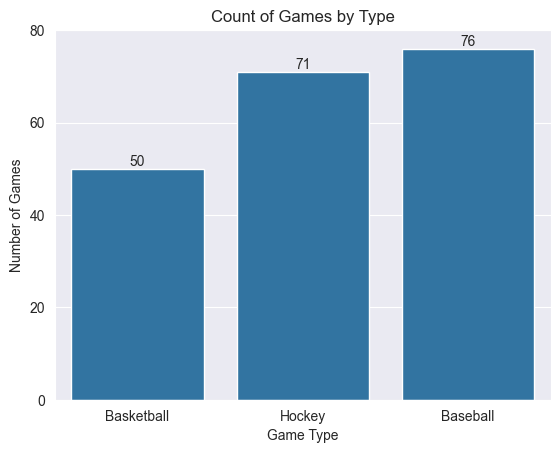

In [10]:
ax = sns.countplot(x='game_type', data=events)

# Add annotations to each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),  
                ha='center', va='center', 
                xytext=(0, 5), 
                textcoords='offset points')
    
plt.title('Count of Games by Type')
plt.xlabel('Game Type')
plt.ylabel('Number of Games')
plt.yticks([0, 20, 40, 60, 80])
plt.show()

In [11]:
# Show min & max game duration
print('Floating point hours:')
print(events['game_duration_hours'].min())
print(events['game_duration_hours'].max())

Floating point hours:
1.98
4.68


Show histogram of game durations as hour-floating point number

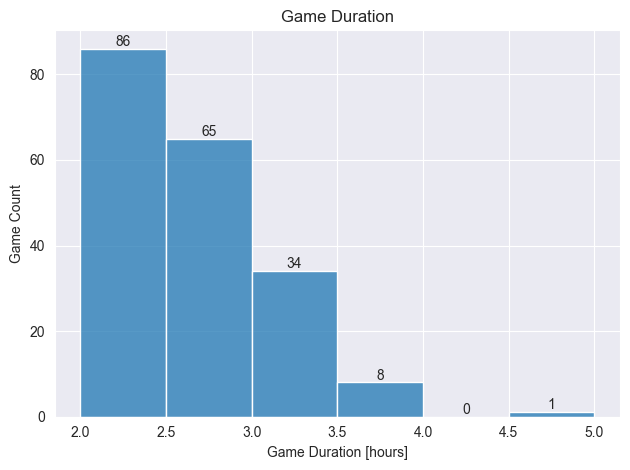

In [12]:
fine_bins = np.arange(2.0, 5.5, 0.5) 

ax = sns.histplot(events['game_duration_hours'], bins=fine_bins)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), 
                textcoords='offset points')

plt.title('Game Duration')
plt.xlabel('Game Duration [hours]')
plt.ylabel('Game Count')
plt.tight_layout()
plt.show()

Now, show game duration as function of game type

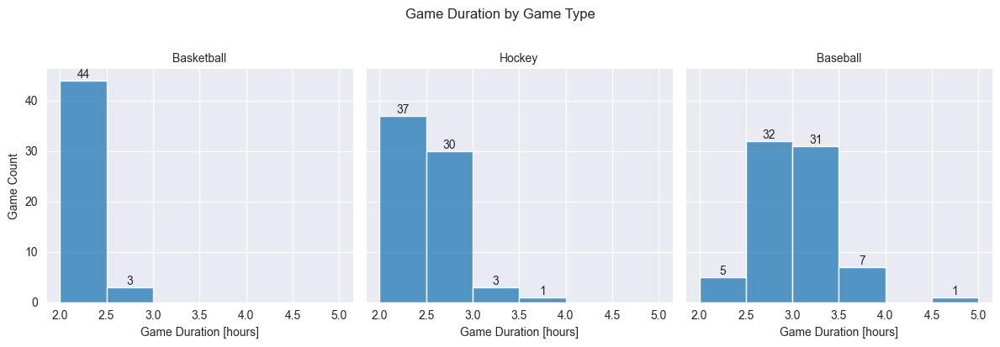

In [13]:
g = sns.FacetGrid(events, col='game_type', col_wrap=3, height=4)
g.map(sns.histplot, 'game_duration_hours', bins=fine_bins)

for ax in g.axes.flat:  
    for p in ax.patches: 
        height = int(p.get_height())  
        if height > 0:  
            ax.annotate(f'{height}', 
                        (p.get_x() + p.get_width() / 2., p.get_height()),  
                        ha='center', va='center', 
                        xytext=(0, 5),  
                        textcoords='offset points')

g.set_axis_labels('Game Duration [hours]', 'Game Count')
g.set_titles('{col_name}')
plt.suptitle('Game Duration by Game Type', y=1.02)
plt.tight_layout()
plt.show()

Typicaly basketball game lasts 2-2.5 hours, hockey game last 2.5-3 hours, and baseball game 3 hours.<br>
Therefore, the graph makes sense.<br>
However, there are a few outliers that are likely the result of over time.<br>

Lets check if there are specific hours when most games are played

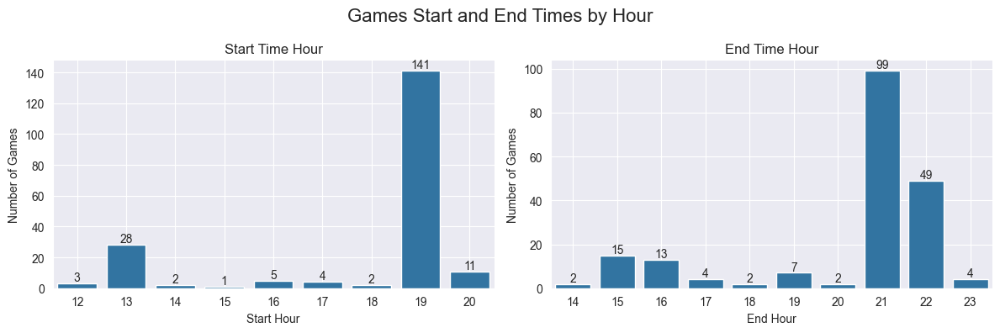

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax1 = sns.countplot(x='start_hour', data=events, ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), 
                textcoords='offset points')
axes[0].set_title('Start Time Hour')
axes[0].set_xlabel('Start Hour')
axes[0].set_ylabel('Number of Games')
axes[0].grid(True)

ax2 = sns.countplot(x='end_hour', data=events, ax=axes[1])

for p in ax2.patches:
    ax2.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), 
                textcoords='offset points')
axes[1].set_title('End Time Hour')
axes[1].set_xlabel('End Hour')
axes[1].set_ylabel('Number of Games')
axes[1].grid(True)

plt.suptitle('Games Start and End Times by Hour', fontsize=16)
plt.tight_layout()
plt.show()

We can see that most games are starting at 19:00, with a few at 20:00.<br>
In addiotion there are games that starts at 13:00, which make sense as basball season includes many day-time games.<br>
As a result, most games are ending at 21:00-22:00, and that should be connected to the game type.<br>
This is also the case for games ending at 15:00-16:00 that are probably the games started at 13:00. 

Now, lets show the average attendance in each game per team

/var/folders/r1/4bd96skd4zl2l77y1lr_pjfh0000gp/T/ipykernel_47923/1032441634.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='team_name', y='attendance', data=average_attendance, palette='viridis')


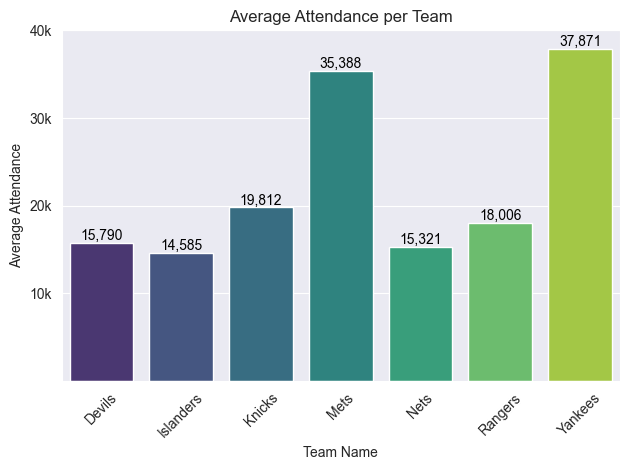

In [15]:
# Calculate the average attendance per team
average_attendance = events.groupby('team_name')['attendance'].mean().reset_index()

ax = sns.barplot(x='team_name', y='attendance', data=average_attendance, palette='viridis')

for index, row in average_attendance.iterrows():
    ax.text(index, row['attendance'], f'{int(row["attendance"]):,}', 
            color='black', ha="center", va="bottom") 

# Convert y-ticks to show attendance in thousands
y_ticks = [10000, 20000, 30000, 40000]
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])

plt.title('Average Attendance per Team')
plt.xlabel('Team Name')
plt.ylabel('Average Attendance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Lets check the attendance per date.<br>
We will sum attendance for identical dates, as there are days in which more than one team hosted a game in New York.

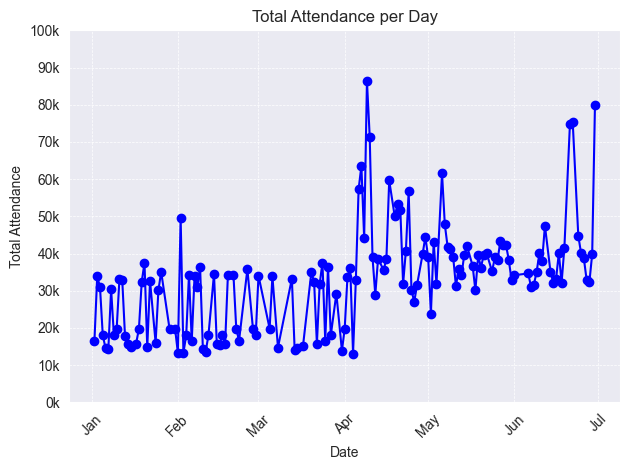

In [16]:
# Convert the 'date' column to datetime (if it's not already)
events['date'] = pd.to_datetime(events['date'])

# Group by date and sum the attendance for each day
daily_attendance = events.groupby(events['date'].dt.date)['attendance'].sum()

# Create a histogram or line plot of attendance over time
# plt.bar(daily_attendance.index, daily_attendance.values, color='blue')
plt.plot(daily_attendance.index, daily_attendance.values, color='blue', marker='o')

plt.title('Total Attendance per Day')
plt.xlabel('Date')
plt.ylabel('Total Attendance')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
xticks = pd.date_range(start=daily_attendance.index.min(), end=daily_attendance.index.max(), freq='MS')
# Add the first of January and July
xticks = pd.DatetimeIndex([pd.to_datetime('2016-01-01')] + list(xticks) + [pd.to_datetime('2016-07-01')])
plt.xticks(xticks, labels=xticks.strftime('%b'), rotation=45)
ax = plt.gca()
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.tight_layout()
plt.show()

We can see that there are months in which there is more attendance.<br>
Lets check what may be the reasons for that.

Show average attendance per month, taking into account unique dates.

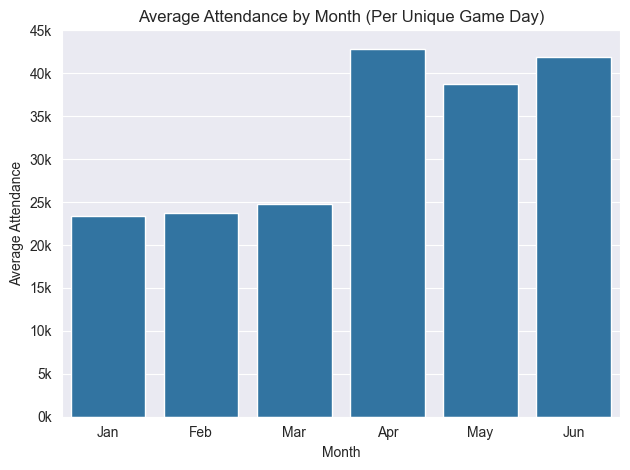

In [17]:
# Group by unique day and sum the attendance per day
daily_attendance = events.groupby(events['date'].dt.date)['attendance'].sum().reset_index()
daily_attendance['date'] = pd.to_datetime(daily_attendance['date'])

# Extract month names for each date
daily_attendance['month'] = daily_attendance['date'].dt.strftime('%b')

# Group by month, calc the total attendance and the number of unique days in each month
monthly_attendance = daily_attendance.groupby('month').agg({
                                                            'attendance': 'sum',
                                                            'date': 'nunique' 
                                                            }).reset_index()

# Calculate the average attendance per month (total attendance / unique days)
monthly_attendance['avg_attendance'] = monthly_attendance['attendance'] / monthly_attendance['date']

# Ensure the months are in the correct order
months_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
monthly_attendance['month'] = pd.Categorical(monthly_attendance['month'], categories=months_order, ordered=True)
monthly_attendance = monthly_attendance.sort_values('month')

ax = sns.barplot(x='month', y='avg_attendance', data=monthly_attendance)

y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.title('Average Attendance by Month (Per Unique Game Day)')
plt.xlabel('Month')
plt.ylabel('Average Attendance')
plt.tight_layout()
plt.show()

Show attendance overtime by each team

/var/folders/r1/4bd96skd4zl2l77y1lr_pjfh0000gp/T/ipykernel_47923/2583809087.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)


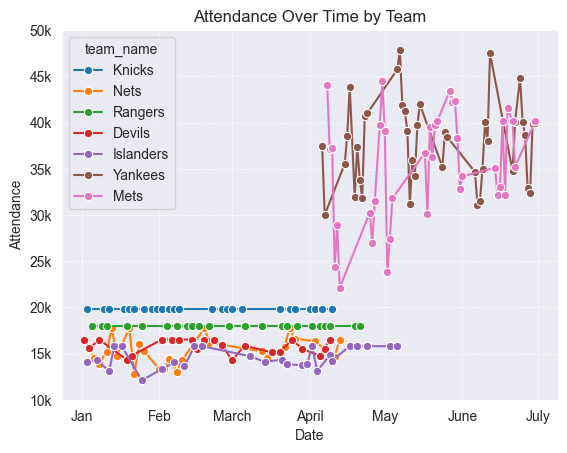

In [18]:
ax = sns.lineplot(x='date', y='attendance', hue='team_name', data=events, marker='o')

xticks = ['Jan', 'Feb', 'March', 'April', 'May', 'June', 'July']
ax.set_xticklabels(xticks)
y_ticks = ax.get_yticks()
ax.set_yticks(y_ticks)
ax.set_yticklabels([f'{int(label/1000)}k' for label in y_ticks])
plt.title('Attendance Over Time by Team')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.xlabel('Date')
plt.ylabel('Attendance')
plt.show()

The sports type popularity goes as: 1. Baseball, Basketball, Hockey.
Therefore, the results make sense - April-June are months with higher attendance as the Mets and Yankees play in this time period.<br>
From the Basketball teams, the Knicks has more attendance (which is also stabler) than the Nets as they are more popular.
Also, from the Hockey teams, we can see that the Rangers has the highest attendance. 


Now, lets see where the games take place.<br>
We will mark the locations of each of the teams' stadiums on the map.<br>
Also, we will mark with circle our assessment of the effective area of ​​each of the districts that appears in the taxi dataset.

In [19]:

# Approximate centroid coordinates for NYC counties represented in the NYC taxi trips dataset
counties = {
    "Manhattan": (40.7831, -73.9712),
    "Brooklyn": (40.6782, -73.9442),
    "Queens": (40.7282, -73.7949),
    "The Bronx": (40.8448, -73.8648),
    "Staten Island": (40.5795, -74.1502)
}

In [20]:
# Randomly sample 10,000 pickup points from the dataset
sampled_pickups = nyc[['pickup_latitude', 'pickup_longitude']].sample(n=10000, random_state=42)

In [27]:
from folium.features import DivIcon

# Initialize the map centered on the events average location
map_center = [events['lat'].mean(), events['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each game location (each team stadium), and text them
for idx, row in events.iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f"Team: {row['team_name']}<br>Game Type: {row['game_type']}",
        tooltip=row['team_name']
    ).add_to(folium_map)

    '''folium.map.Marker(
        [row['lat'], row['long']],
        icon=DivIcon(
            icon_size=(150, 36),
            icon_anchor=(0, 0),
            html=f'<div style="font-size: 12pt; color: black;">{row["team_name"]}</div>',
        )
    ).add_to(folium_map)'''

# Load GeoJSON data for the 5 counties (you need to have or find a GeoJSON file for the boroughs)
geojson_url = 'Borough Boundaries.geojson'

# Add the GeoJSON layer with different colors for each borough
folium.GeoJson(
    geojson_url,
    name="Boroughs",
    style_function=lambda feature: {
        'fillColor': 'none',
        'color': {
            'Manhattan': 'green',
            'Brooklyn': 'blue',
            'Queens': 'purple',
            'Bronx': 'red',
            'Staten Island': 'orange'
        }.get(feature['properties']['boro_name'], 'black'),
        'weight': 2,
        'opacity': 1,
    }
).add_to(folium_map)

# Add layer control
folium.LayerControl().add_to(folium_map)

# Display the map
folium_map.save("game_locations_map.html")
folium_map


In [28]:
# Initialize the map centered on the events' average location
map_center = [events['lat'].mean(), events['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each game location (each team stadium), and text them
for idx, row in events.iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f"Team: {row['team_name']}<br>Game Type: {row['game_type']}",
        tooltip=row['team_name']
    ).add_to(folium_map)

    '''folium.map.Marker(
        [row['lat'], row['long']],
        icon=DivIcon(
            icon_size=(150, 36),
            icon_anchor=(0, 0),
            html=f'<div style="font-size: 12pt; color: black;">{row["team_name"]}</div>',
        )
    ).add_to(folium_map)'''

# Add circles to represent each county (borough)
for borough, coords in counties.items():
    folium.Circle(
        location=coords,
        radius=5000, 
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.2,
        popup=borough
    ).add_to(folium_map)

# Add 10,000 random pickup points from the taxi dataset
sampled_pickups = nyc[['pickup_latitude', 'pickup_longitude']].sample(n=10000, random_state=42)

# Add pickup points as CircleMarkers to the map
for idx, row in sampled_pickups.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=1,  # Small marker size
        color='red',  # Color of the marker
        fill=True,
        fill_color='red',
        fill_opacity=0.5
    ).add_to(folium_map)

# Add a layer control to toggle the layers
folium.LayerControl().add_to(folium_map)

# Display the map
folium_map.save("game_locations_map_with_pickups.html")
folium_map

In [29]:

# Initialize the map centered on the events average location
map_center = [events['lat'].mean(), events['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each game location (each team stadium), and text them
for idx, row in events.iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f"Team: {row['team_name']}<br>Game Type: {row['game_type']}",
        tooltip=row['team_name']
    ).add_to(folium_map)

    '''folium.map.Marker(
        [row['lat'], row['long']],
        icon=DivIcon(
            icon_size=(150, 36),
            icon_anchor=(0, 0),
            html=f'<div style="font-size: 12pt; color: black;">{row["team_name"]}</div>',
        )
    ).add_to(folium_map)'''

# Add circles to represent approximatly each countie 
for borough, coords in counties.items():
    folium.Circle(
        location=coords,
        radius=5000, 
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.2,
        popup=borough
    ).add_to(folium_map)
folium.LayerControl().add_to(folium_map)

# Display the map
folium_map.save("game_locations_map.html")
folium_map

We can see that the Devils hosting their games probably out of the scope of the nyc taxi trips.<br>
Furthermore TBD

Now, lets analyze the correlation between the games and the volume of taxi trips

In [30]:
nyc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1458644 non-null  object 
 1   vendor_id           1458644 non-null  int64  
 2   pickup_datetime     1458644 non-null  object 
 3   dropoff_datetime    1458644 non-null  object 
 4   passenger_count     1458644 non-null  int64  
 5   pickup_longitude    1458644 non-null  float64
 6   pickup_latitude     1458644 non-null  float64
 7   dropoff_longitude   1458644 non-null  float64
 8   dropoff_latitude    1458644 non-null  float64
 9   store_and_fwd_flag  1458644 non-null  object 
 10  trip_duration       1458644 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 122.4+ MB


In [31]:
nyc.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


As we are trying to assess the correlation between games and volume of taxi trips, lets define some relevant functions.<br>
<br>
We would like to:<br> 
Calculate the distance according to lat/lon posistions.<br>
<br>
Filter taxi trips that are related to the game, so we will filter by -<br>
    taxi trip should be in the game's date, and located close enough to the stadium.<br>
    dropoff should be in time window of 1 hour before the game.<br>
    pickup should be in time window of 1 hour after the game.<br>

In [32]:
from datetime import datetime, timedelta
def manhattan_distance(lon1, lat1, lon2, lat2):
    # Convert degrees to kilometers (approx conversion assuming each degree of latitude is about 111km)
    lat_km = 111  # Kilometers per degree latitude
    lon_km = 85   # Kilometers per degree longitude in NYC area (varies slightly by location)

    # Calculate Manhattan distance in kilometers
    distance = np.abs(lon2 - lon1) * lon_km + np.abs(lat2 - lat1) * lat_km
    return distance

def haversine_distance(lon1, lat1, lon2, lat2):
    # Convert latitude and longitude from degrees to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of Earth in kilometers
    return c * r

def filter_taxi_trips_near_event_manhattan(taxi_df, event_lat, event_lon, radius, distance_func=haversine_distance):
    # Calculate Manhattan distances for both pickup and dropoff locations
    taxi_df.loc[:,'pickup_distance'] = distance_func(taxi_df['pickup_longitude'], taxi_df['pickup_latitude'], event_lon, event_lat)
    taxi_df.loc[:,'dropoff_distance'] = distance_func(taxi_df['dropoff_longitude'], taxi_df['dropoff_latitude'], event_lon, event_lat)
    
    # Filter trips that have either pickup or dropoff within the given radius
    trips_near_event = taxi_df[(taxi_df['pickup_distance'] <= radius) | (taxi_df['dropoff_distance'] <= radius)]
    
    return trips_near_event

def filter_trips_by_event(taxi_df, event_date, start_time, end_time, event_lat, event_lon, radius, distance_func=haversine_distance):
    hour_before_start = start_time - timedelta(minutes=60)
    hour_after_end = end_time + timedelta(minutes=60)
 
    event_day_trips = taxi_df[(taxi_df['pickup_datetime'].dt.date == event_date) &
                              (
                              ((taxi_df['dropoff_datetime'].dt.time >= hour_before_start.time()) & (taxi_df['dropoff_datetime'].dt.time <= start_time.time())) |
                              ((taxi_df['pickup_datetime'].dt.time >= end_time.time()) & (taxi_df['pickup_datetime'].dt.time <= hour_after_end.time()))
                              )].copy()
    # Then filter by proximity to the event location
    trips_near_event = filter_taxi_trips_near_event_manhattan(event_day_trips, event_lat, event_lon, radius, distance_func=distance_func)
    
    return trips_near_event

In [33]:
# Change pickup_datetime and dropooff_datetime to datetime
nyc['pickup_datetime'] = pd.to_datetime(nyc['pickup_datetime'])
nyc['dropoff_datetime'] = pd.to_datetime(nyc['dropoff_datetime'])

In [34]:
results = []

for index, event in events.iterrows():
    event_date = event['date'].date()
    event_lat = event['lat']
    event_lon = event['long']
    event_team = event['team_name']
    event_start_time = datetime.strptime(event['start_time'], '%H:%M:%S')    
    event_end_time = datetime.strptime(event['end_time'], '%H:%M:%S')
    # Filter taxi trips for this event
    trips_near_event = filter_trips_by_event(nyc, event_date,event_start_time, event_end_time, event_lat, event_lon, radius=0.5, distance_func=haversine_distance)
    
    # Calculate trip count, average duration
    trip_count = len(trips_near_event)
    avg_trip_duration = trips_near_event['trip_duration'].mean()
    
    results.append({
        'Event Date': event_date,
        'Event Start Time': event_start_time,
        'Event End Time': event_end_time,
        'Trip Count': trip_count,
        'Avg Trip Duration': avg_trip_duration,
        'Attendance': event['attendance'], # Attendance
        'Team': event_team
    })

# Convert results to data frame
results_df = pd.DataFrame(results)

In [35]:
results_df

,Event Date,Event Start Time,Event End Time,Trip Count,Avg Trip Duration,Attendance,Team
0,2016-01-03,1900-01-01 15:30:00,1900-01-01 17:33:00,95,1697.726316,19812,Knicks
1,2016-01-10,1900-01-01 19:30:00,1900-01-01 21:40:00,73,694.369863,19812,Knicks
2,2016-01-12,1900-01-01 19:30:00,1900-01-01 21:46:00,86,756.918605,19812,Knicks
3,2016-01-18,1900-01-01 13:00:00,1900-01-01 15:59:00,96,791.531250,19812,Knicks
4,2016-01-20,1900-01-01 19:30:00,1900-01-01 22:12:00,90,833.988889,19812,Knicks
...,...,...,...,...,...,...,...
192,2016-06-18,1900-01-01 20:16:00,1900-01-01 23:18:00,0,NaN,32134,Mets
193,2016-06-19,1900-01-01 13:11:00,1900-01-01 16:02:00,2,1736.000000,41576,Mets
194,2016-06-21,1900-01-01 19:10:00,1900-01-01 22:06:00,1,2327.000000,40122,Mets
195,2016-06-22,1900-01-01 13:12:00,1900-01-01 16:18:00,0,NaN,35185,Mets


The trip count column represents number of trips in the relevant game date, location, and time slot<br>

Lets check the average trip count per team<br>

In [37]:
average_trip_counts_per_team = results_df.groupby('Team')['Trip Count'].mean()
average_trip_counts_per_team

Team
Devils        0.000000
Islanders     3.923077
Knicks       93.760000
Mets          0.472222
Nets          4.280000
Rangers      87.565217
Yankees       1.025000
Name: Trip Count, dtype: float64

In [38]:
average_trip_counts_per_team_df = pd.DataFrame(average_trip_counts_per_team)
average_trip_counts_per_team_df

,Trip Count
Team,
Devils,0.000000
Islanders,3.923077
Knicks,93.760000
Mets,0.472222
Nets,4.280000
Rangers,87.565217
Yankees,1.025000


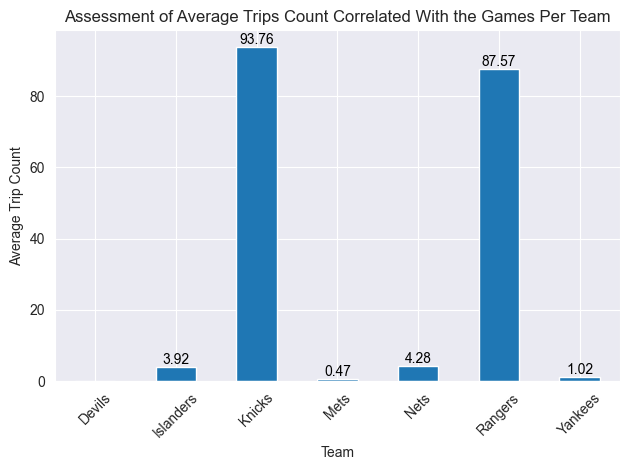

In [39]:
ax = average_trip_counts_per_team_df.plot(kind='bar', legend=False)

for index, (team, row) in enumerate(average_trip_counts_per_team_df.iterrows()):
    trip_count = row['Trip Count']
    if trip_count > 0:  
        ax.text(index, trip_count, f'{trip_count:.2f}',  
                color='black', ha="center", va="bottom")
        
plt.xlabel('Team')
plt.ylabel('Average Trip Count')
plt.title('Assessment of Average Trips Count Correlated With the Games Per Team')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

We can see that there are almost no trips occurred for all teams, but to the Knicks are Rangers.<br>
It can be concluded from this that:<br>
&emsp;1.Other public transportation are prefered when it comes to sports fans.<br>
&emsp;2.The Knicks and Rangers are hosting in the Madison Square Garden, which is located in the heart of Manhattan.<br>
&emsp;Most trips are from/to Manhattan, and generally speaking this is the 'busiest' area of New York.
 

So, lets filter the Knicks and Rangers.<br>
We will compare the trips volume to the same location and time slot on the days when there is no game.

In [40]:
# Filter Manhattan teams - Knicks, Rangers
# Get only date, start_time, end_time
knicks = events[events['team_name'] == 'Knicks']
knicks = knicks[['date', 'start_time', 'end_time','lat','long']]

rangers = events[events['team_name'] == 'Rangers']
rangers = rangers[['date', 'start_time', 'end_time','lat','long']]

Calc amount of trips according to Knicks games location and time slot

In [41]:
trip_counts_near_knicks= []
for idx, row in knicks.iterrows():
    date = row['date'].date()
    hour_before_start = datetime.strptime(row['start_time'], '%H:%M:%S') - timedelta(minutes=60)
    hour_after_end = datetime.strptime(row['end_time'], '%H:%M:%S') + timedelta(minutes=60)
    # get all trips that are not on the same date
    trips = nyc[nyc['pickup_datetime'].dt.date != date]
    # calculate the mean trip count between the hour before the game and the hour after the game
    trip_in_interval = trips[
                              (
                              ((trips['dropoff_datetime'].dt.time >= hour_before_start.time()) & (trips['dropoff_datetime'].dt.time <= datetime.strptime(row['start_time'], '%H:%M:%S').time())) |
                              ((trips['pickup_datetime'].dt.time >= datetime.strptime(row['end_time'], '%H:%M:%S').time()) & (trips['pickup_datetime'].dt.time <= hour_after_end.time()))
                              )].copy()
    trip_within_radius = filter_taxi_trips_near_event_manhattan(trip_in_interval, row['lat'], row['long'], radius=0.5)
    # groupby date and count the number of trips
    trip_counts_near_knicks.append(trip_within_radius.groupby(trip_within_radius['pickup_datetime'].dt.date).size().mean())

print(trip_counts_near_knicks)
    

[76.74033149171271, 79.8, 79.65555555555555, 68.73480662983425, 77.76666666666667, 79.39444444444445, 78.26666666666667, 80.03333333333333, 79.81111111111112, 79.65555555555555, 79.28333333333333, 71.646408839779, 77.72777777777777, 79.83333333333333, 79.97222222222223, 79.68333333333334, 80.09444444444445, 77.60555555555555, 80.46666666666667, 80.28333333333333, 79.55, 80.17777777777778, 79.38888888888889, 80.33333333333333, 79.53333333333333]


Calc amount of trips according to Rangers games location and time slot

In [42]:
trip_counts_near_rangers= []
for idx, row in rangers.iterrows():
    date = row['date'].date()
    hour_before_start = datetime.strptime(row['start_time'], '%H:%M:%S') - timedelta(minutes=60)
    hour_after_end = datetime.strptime(row['end_time'], '%H:%M:%S') + timedelta(minutes=60)
    # get all trips that are not on the same date
    trips = nyc[nyc['pickup_datetime'].dt.date != date]
    # calculate the mean trip count between the hour before the game and the hour after the game
    trip_in_interval = trips[
                              (
                              ((trips['dropoff_datetime'].dt.time >= hour_before_start.time()) & (trips['dropoff_datetime'].dt.time <= datetime.strptime(row['start_time'], '%H:%M:%S').time())) |
                              ((trips['pickup_datetime'].dt.time >= datetime.strptime(row['end_time'], '%H:%M:%S').time()) & (trips['pickup_datetime'].dt.time <= hour_after_end.time()))
                              )].copy()
    trip_within_radius = filter_taxi_trips_near_event_manhattan(trip_in_interval, row['lat'], row['long'], radius=0.5)
    # groupby date and count the number of trips
    trip_counts_near_rangers.append(trip_within_radius.groupby(trip_within_radius['pickup_datetime'].dt.date).size().mean())

print(trip_counts_near_rangers)

[77.73333333333333, 70.33149171270718, 77.69444444444444, 76.91666666666667, 78.87777777777778, 77.63888888888889, 77.16111111111111, 76.72777777777777, 78.44444444444444, 76.52777777777777, 76.71111111111111, 77.4, 74.57222222222222, 72.86187845303867, 76.79444444444445, 74.88888888888889, 77.8, 76.93333333333334, 78.86111111111111, 77.70555555555555, 72.43646408839778, 77.05555555555556, 76.47222222222223]


In [43]:
results_df[results_df['Team'] == 'Knicks'].groupby('Event Date')['Trip Count'].mean()

Event Date
2016-01-03     95.0
2016-01-10     73.0
2016-01-12     86.0
2016-01-18     96.0
2016-01-20     90.0
2016-01-22     98.0
2016-01-26     74.0
2016-01-29    105.0
2016-01-31     86.0
2016-02-02     99.0
2016-02-05    122.0
2016-02-07     97.0
2016-02-09     92.0
2016-02-22     95.0
2016-02-26     91.0
2016-02-28     94.0
2016-03-01    106.0
2016-03-05     94.0
2016-03-20     86.0
2016-03-24     86.0
2016-03-26    103.0
2016-04-01     91.0
2016-04-03    100.0
2016-04-06     77.0
2016-04-10    108.0
Name: Trip Count, dtype: float64

In [44]:
results_df[results_df['Team'] == 'Rangers'].groupby('Event Date')['Trip Count'].mean()

Event Date
2016-01-05     83.0
2016-01-09     97.0
2016-01-11     92.0
2016-01-19     95.0
2016-01-25     78.0
2016-02-04     85.0
2016-02-08     84.0
2016-02-12    109.0
2016-02-14     84.0
2016-02-17     99.0
2016-02-21     93.0
2016-02-29     84.0
2016-03-06     99.0
2016-03-13     98.0
2016-03-21     78.0
2016-03-23     90.0
2016-03-27     84.0
2016-04-02     92.0
2016-04-05     81.0
2016-04-07     87.0
2016-04-09     89.0
2016-04-19     75.0
2016-04-21     58.0
Name: Trip Count, dtype: float64

In [45]:
knicks_trip_counts = pd.DataFrame(results_df[results_df['Team'] == 'Knicks'].groupby('Event Date')['Trip Count'].mean())

# add trip counts in the same location and hours at that day, for different days
knicks_trip_counts['Trip Count Other Dates'] = trip_counts_near_knicks
# add diff column
knicks_trip_counts['Diff'] = knicks_trip_counts['Trip Count'] - knicks_trip_counts['Trip Count Other Dates']
# add diff in percentage
knicks_trip_counts['Diff %'] = (knicks_trip_counts['Diff'] / knicks_trip_counts['Trip Count Other Dates']) * 100
# add date as column instead of index
knicks_trip_counts['Date'] = pd.to_datetime(knicks_trip_counts.index)
knicks_trip_counts = knicks_trip_counts.reset_index(drop=True)
knicks_trip_counts.index = pd.RangeIndex(start=1, stop=len(knicks_trip_counts) + 1, step=1)
# add the day at that date
knicks_trip_counts['Day of Week'] = knicks_trip_counts['Date'].dt.day_name()

knicks_trip_counts


,Trip Count,Trip Count Other Dates,Diff,Diff %,Date,Day of Week
1,95.0,76.740331,18.259669,23.794096,2016-01-03,Sunday
2,73.0,79.800000,-6.800000,-8.521303,2016-01-10,Sunday
3,86.0,79.655556,6.344444,7.964849,2016-01-12,Tuesday
4,96.0,68.734807,27.265193,39.667229,2016-01-18,Monday
5,90.0,77.766667,12.233333,15.730819,2016-01-20,Wednesday
6,98.0,79.394444,18.605556,23.434329,2016-01-22,Friday
7,74.0,78.266667,-4.266667,-5.451448,2016-01-26,Tuesday
8,105.0,80.033333,24.966667,31.195335,2016-01-29,Friday
9,86.0,79.811111,6.188889,7.754420,2016-01-31,Sunday
10,99.0,79.655556,19.344444,24.285116,2016-02-02,Tuesday


In [46]:
rangers_trip_counts = pd.DataFrame(results_df[results_df['Team'] == 'Rangers'].groupby('Event Date')['Trip Count'].mean())

# add trip counts in the same location and hours at that day, for different days
rangers_trip_counts['Trip Count Other Dates'] = trip_counts_near_rangers
# add diff column
rangers_trip_counts['Diff'] = rangers_trip_counts['Trip Count'] - rangers_trip_counts['Trip Count Other Dates']
# add diff in percentage
rangers_trip_counts['Diff %'] = (rangers_trip_counts['Diff'] / rangers_trip_counts['Trip Count Other Dates']) * 100
# add date as column instead of index
rangers_trip_counts['Date'] = pd.to_datetime(rangers_trip_counts.index)
rangers_trip_counts = rangers_trip_counts.reset_index(drop=True)
rangers_trip_counts.index = pd.RangeIndex(start=1, stop=len(rangers_trip_counts) + 1, step=1)
# add the day at that date
rangers_trip_counts['Day of Week'] = rangers_trip_counts['Date'].dt.day_name()

rangers_trip_counts


,Trip Count,Trip Count Other Dates,Diff,Diff %,Date,Day of Week
1,83.0,77.733333,5.266667,6.775300,2016-01-05,Tuesday
2,97.0,70.331492,26.668508,37.918303,2016-01-09,Saturday
3,92.0,77.694444,14.305556,18.412585,2016-01-11,Monday
4,95.0,76.916667,18.083333,23.510293,2016-01-19,Tuesday
5,78.0,78.877778,-0.877778,-1.112833,2016-01-25,Monday
6,85.0,77.638889,7.361111,9.481216,2016-02-04,Thursday
7,84.0,77.161111,6.838889,8.863129,2016-02-08,Monday
8,109.0,76.727778,32.272222,42.060676,2016-02-12,Friday
9,84.0,78.444444,5.555556,7.082153,2016-02-14,Sunday
10,99.0,76.527778,22.472222,29.364791,2016-02-17,Wednesday


In [47]:
# Filter rows where 'Diff %' is negative and display with day of the week
# Knicks
negative_diff_df = knicks_trip_counts[knicks_trip_counts['Diff %'] < 0].copy()
negative_diff_df['Day of Week'] = negative_diff_df['Date'].dt.day_name()

print("Knicks:")
print(negative_diff_df[['Date', 'Diff %', 'Day of Week']])

# Rangers
negative_diff_df = rangers_trip_counts[rangers_trip_counts['Diff %'] < 0].copy()
negative_diff_df['Day of Week'] = negative_diff_df['Date'].dt.day_name()

print("Rangers:")
print(negative_diff_df[['Date', 'Diff %', 'Day of Week']])


Knicks:
         Date    Diff % Day of Week
2  2016-01-10 -8.521303      Sunday
7  2016-01-26 -5.451448     Tuesday
24 2016-04-06 -4.149378   Wednesday
Rangers:
         Date     Diff % Day of Week
5  2016-01-25  -1.112833      Monday
22 2016-04-19  -2.667628     Tuesday
23 2016-04-21 -24.155467    Thursday


/var/folders/r1/4bd96skd4zl2l77y1lr_pjfh0000gp/T/ipykernel_47923/3861930496.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Day of Week', y='Diff %', data=diff_by_day, palette='viridis', ax=axes[0])
/var/folders/r1/4bd96skd4zl2l77y1lr_pjfh0000gp/T/ipykernel_47923/3861930496.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Day of Week', y='Diff %', data=diff_by_day, palette='viridis', ax=axes[1])


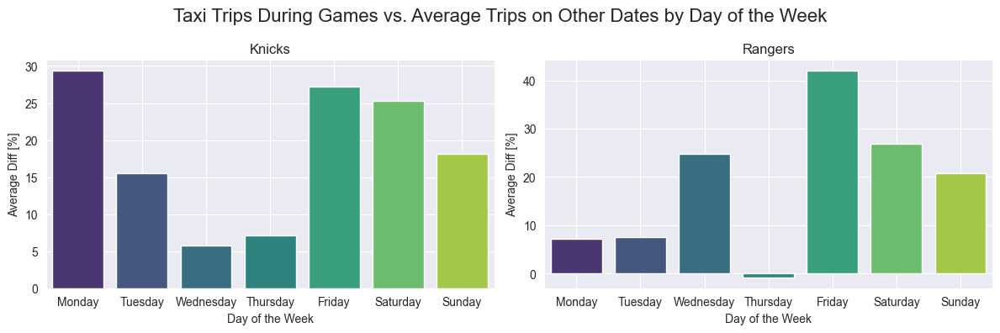

In [48]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Group by the day of the week and calculate the average of 'Diff %'
diff_by_day = knicks_trip_counts.groupby('Day of Week')['Diff %'].mean().reset_index()
# Sort the days in the correct order (Monday to Sunday)
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
diff_by_day['Day of Week'] = pd.Categorical(diff_by_day['Day of Week'], categories=days_order, ordered=True)
diff_by_day = diff_by_day.sort_values('Day of Week')

sns.barplot(x='Day of Week', y='Diff %', data=diff_by_day, palette='viridis', ax=axes[0])
axes[0].set_title('Knicks')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Average Diff [%]')
axes[0].grid(True)

# Group by the day of the week and calculate the average of 'Diff %'
diff_by_day = rangers_trip_counts.groupby('Day of Week')['Diff %'].mean().reset_index()
# Sort the days in the correct order (Monday to Sunday)
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
diff_by_day['Day of Week'] = pd.Categorical(diff_by_day['Day of Week'], categories=days_order, ordered=True)
diff_by_day = diff_by_day.sort_values('Day of Week')

sns.barplot(x='Day of Week', y='Diff %', data=diff_by_day, palette='viridis', ax=axes[1])
axes[1].set_title('Rangers')
axes[1].set_xlabel('Day of the Week')
axes[1].set_ylabel('Average Diff [%]')
axes[1].grid(True)

plt.suptitle('Taxi Trips During Games vs. Average Trips on Other Dates by Day of the Week', fontsize=16)
plt.tight_layout()
plt.show()

/var/folders/r1/4bd96skd4zl2l77y1lr_pjfh0000gp/T/ipykernel_47923/199610411.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Day of Week', y='Diff %', data=knicks_trip_counts, order=days_order, jitter=False, palette='viridis', ax=axes[0])
/var/folders/r1/4bd96skd4zl2l77y1lr_pjfh0000gp/T/ipykernel_47923/199610411.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Day of Week', y='Diff %', data=rangers_trip_counts, order=days_order, jitter=False, palette='viridis', ax=axes[1])


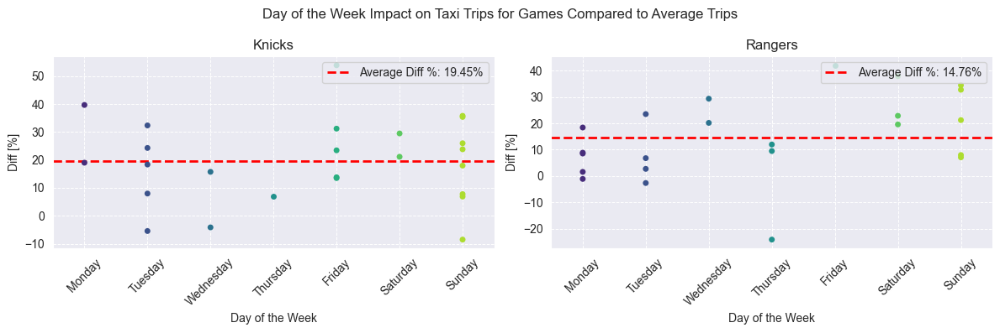

In [49]:
# Create a scatter plot (strip plot) to show each individual Diff Precentage by day of the week

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.stripplot(x='Day of Week', y='Diff %', data=knicks_trip_counts, order=days_order, jitter=False, palette='viridis', ax=axes[0])

knicks_mean_diff = knicks_trip_counts['Diff %'].mean()
avg_line_knicks = axes[0].axhline(knicks_mean_diff, color='red', linestyle='--', linewidth=2, label=f'Average Diff %: {knicks_mean_diff:.2f}%')
axes[0].legend([avg_line_knicks], [f'Average Diff %: {knicks_mean_diff:.2f}%'], loc='upper right')

axes[0].grid(True, which='both', axis='both', linestyle='--', linewidth=0.7)
axes[0].set_title('Knicks')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Diff [%]')
axes[0].tick_params(axis='x', rotation=45) 

sns.stripplot(x='Day of Week', y='Diff %', data=rangers_trip_counts, order=days_order, jitter=False, palette='viridis', ax=axes[1])

rangers_mean_diff = rangers_trip_counts['Diff %'].mean()
avg_line_rangers = axes[1].axhline(rangers_mean_diff, color='red', linestyle='--', linewidth=2, label=f'Average Diff %: {rangers_mean_diff:.2f}%')
axes[1].legend([avg_line_rangers], [f'Average Diff %: {rangers_mean_diff:.2f}%'], loc='upper right')

axes[1].grid(True, which='both', axis='both', linestyle='--', linewidth=0.7)
axes[1].set_title('Rangers')
axes[1].set_xlabel('Day of the Week')
axes[1].set_ylabel('Diff [%]')
axes[1].tick_params(axis='x', rotation=45) 

plt.suptitle('Day of the Week Impact on Taxi Trips for Games Compared to Average Trips')
plt.tight_layout()
plt.show()

In [50]:
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 197 non-null    datetime64[ns]
 1   attendance           197 non-null    int64         
 2   game_duration        197 non-null    object        
 3   start_time           197 non-null    object        
 4   team_name            197 non-null    object        
 5   lat                  197 non-null    float64       
 6   long                 197 non-null    float64       
 7   game_type            197 non-null    object        
 8   end_time             197 non-null    object        
 9   start_hour           197 non-null    int32         
 10  end_hour             197 non-null    int32         
 11  game_duration_hours  197 non-null    float64       
 12  month                197 non-null    object        
dtypes: datetime64[ns](1), float64(3), i

In [51]:
nyc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1458644 non-null  object        
 1   vendor_id           1458644 non-null  int64         
 2   pickup_datetime     1458644 non-null  datetime64[ns]
 3   dropoff_datetime    1458644 non-null  datetime64[ns]
 4   passenger_count     1458644 non-null  int64         
 5   pickup_longitude    1458644 non-null  float64       
 6   pickup_latitude     1458644 non-null  float64       
 7   dropoff_longitude   1458644 non-null  float64       
 8   dropoff_latitude    1458644 non-null  float64       
 9   store_and_fwd_flag  1458644 non-null  object        
 10  trip_duration       1458644 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(3), object(2)
memory usage: 122.4+ MB


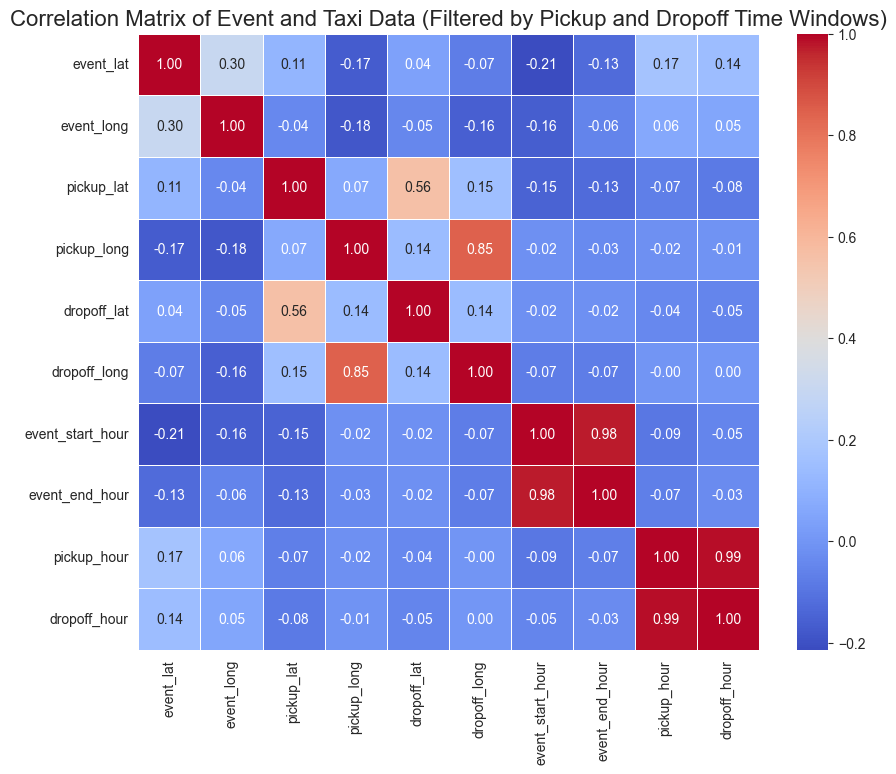

In [52]:
# Extract date and hour from events (without modifying the original DataFrame)
events_dates = pd.to_datetime(events['date']).dt.date
events_start_hour = events['start_hour']
events_end_hour = events['end_hour']

# Extract pickup and dropoff date and hour from NYC taxi trips
nyc_pickup_date = nyc['pickup_datetime'].dt.date
nyc_dropoff_date = nyc['dropoff_datetime'].dt.date
nyc_pickup_hour = nyc['pickup_datetime'].dt.hour
nyc_dropoff_hour = nyc['dropoff_datetime'].dt.hour

# Filter taxi trips based on the given time conditions for pickup and dropoff
nyc_filtered = nyc[((nyc['dropoff_datetime'].dt.hour >= 12) & (nyc['dropoff_datetime'].dt.hour < 13)) |
                   ((nyc['dropoff_datetime'].dt.hour >= 18) & (nyc['dropoff_datetime'].dt.hour < 19)) |
                   ((nyc['pickup_datetime'].dt.hour >= 15) & (nyc['pickup_datetime'].dt.hour < 17)) |
                   ((nyc['pickup_datetime'].dt.hour >= 21) & (nyc['pickup_datetime'].dt.hour < 23))]

# Select lat/lon from both DataFrames
events_lat = events['lat']
events_long = events['long']
nyc_pickup_latitude = nyc_filtered['pickup_latitude']
nyc_pickup_longitude = nyc_filtered['pickup_longitude']
nyc_dropoff_latitude = nyc_filtered['dropoff_latitude']
nyc_dropoff_longitude = nyc_filtered['dropoff_longitude']

# Create a temporary DataFrame with all selected columns (without modifying original DataFrames)
correlation_data = pd.DataFrame({
    'event_lat': events_lat,
    'event_long': events_long,
    'pickup_lat': nyc_pickup_latitude,
    'pickup_long': nyc_pickup_longitude,
    'dropoff_lat': nyc_dropoff_latitude,
    'dropoff_long': nyc_dropoff_longitude,
    'event_start_hour': events_start_hour,
    'event_end_hour': events_end_hour,
    'pickup_hour': nyc_filtered['pickup_datetime'].dt.hour,
    'dropoff_hour': nyc_filtered['dropoff_datetime'].dt.hour
})

# Compute the correlation matrix
correlation_matrix = correlation_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=.5)

# Add titles and labels
plt.title('Correlation Matrix of Event and Taxi Data (Filtered by Pickup and Dropoff Time Windows)', fontsize=16)
plt.show()